In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
sns.set_theme(color_codes = True)

In [45]:
df = pd.read_csv('realtor-data.csv')

In [46]:
df.head()

,status,bed,bath,acre_lot,city,state,zip_code,house_size,prev_sold_date,price
0,for_sale,3.0,2.0,0.12,Adjuntas,Puerto Rico,601.0,920.0,NaN,105000.0
1,for_sale,4.0,2.0,0.08,Adjuntas,Puerto Rico,601.0,1527.0,NaN,80000.0
2,for_sale,2.0,1.0,0.15,Juana Diaz,Puerto Rico,795.0,748.0,NaN,67000.0
3,for_sale,4.0,2.0,0.10,Ponce,Puerto Rico,731.0,1800.0,NaN,145000.0
4,for_sale,6.0,2.0,0.05,Mayaguez,Puerto Rico,680.0,NaN,NaN,65000.0


In [47]:
df.shape

(100000, 10)

In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   status          100000 non-null  object 
 1   bed             75050 non-null   float64
 2   bath            75112 non-null   float64
 3   acre_lot        85987 non-null   float64
 4   city            99948 non-null   object 
 5   state           100000 non-null  object 
 6   zip_code        99805 non-null   float64
 7   house_size      75082 non-null   float64
 8   prev_sold_date  28745 non-null   object 
 9   price           100000 non-null  float64
dtypes: float64(6), object(4)
memory usage: 7.6+ MB


In [49]:
df.describe()

,bed,bath,acre_lot,zip_code,house_size,price
count,75050.000000,75112.000000,85987.000000,99805.000000,7.508200e+04,1.000000e+05
mean,3.701013,2.494595,13.613473,2132.003467,2.180082e+03,4.383656e+05
std,2.091372,1.573324,840.143878,2455.654774,5.625349e+03,1.015773e+06
min,1.000000,1.000000,0.000000,601.000000,1.000000e+02,4.450000e+02
25%,3.000000,2.000000,0.190000,971.000000,1.200000e+03,1.250000e+05
50%,3.000000,2.000000,0.510000,1225.000000,1.728000e+03,2.650000e+05
75%,4.000000,3.000000,2.000000,1611.000000,2.582000e+03,4.749000e+05
max,86.000000,56.000000,100000.000000,99999.000000,1.450112e+06,6.000000e+07


In [50]:
df.describe(include='object')

,status,city,state,prev_sold_date
count,100000,99948,100000,28745
unique,2,525,12,3604
top,for_sale,San Juan,Massachusetts,2019-10-01
freq,99819,4788,52694,83


In [51]:
df.duplicated().sum()

85364

In [52]:
df.drop_duplicates(inplace = True)

In [53]:
total_missing = (df.isna().sum()*100)/len(df)
print('PERCENTAGE TOTAL MISSING')
print(total_missing)

PERCENTAGE TOTAL MISSING
status             0.000000
bed               22.875102
bath              22.868270
acre_lot          12.599071
city               0.109319
state              0.000000
zip_code           0.191309
house_size        22.861438
prev_sold_date    63.815250
price              0.000000
dtype: float64


In [54]:
df['bed'].fillna(df['bed'].mode()[0],inplace = True)
df['bath'].fillna(df['bath'].mode()[0],inplace = True)
df['acre_lot'].fillna(df['acre_lot'].mode()[0],inplace = True)
df['house_size'].fillna(df['house_size'].mode()[0],inplace = True)

In [55]:
df = df.dropna(subset = ['zip_code','city'])
df = df.drop('prev_sold_date',axis=1)

In [56]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14607 entries, 0 to 97288
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   status      14607 non-null  object 
 1   bed         14607 non-null  float64
 2   bath        14607 non-null  float64
 3   acre_lot    14607 non-null  float64
 4   city        14607 non-null  object 
 5   state       14607 non-null  object 
 6   zip_code    14607 non-null  float64
 7   house_size  14607 non-null  float64
 8   price       14607 non-null  float64
dtypes: float64(6), object(3)
memory usage: 1.1+ MB


In [57]:
df.isnull().sum()

status        0
bed           0
bath          0
acre_lot      0
city          0
state         0
zip_code      0
house_size    0
price         0
dtype: int64

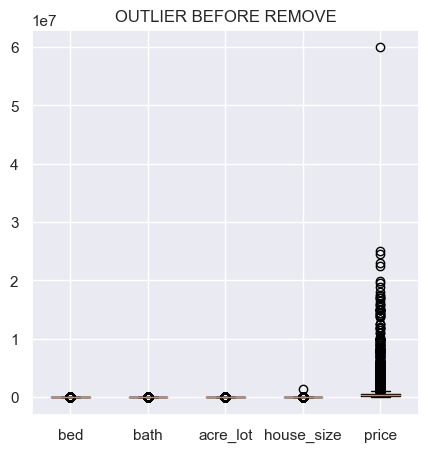

In [58]:
column_num = ['bed','bath','acre_lot','house_size','price']
plt.figure(figsize=(5,5))
plt.boxplot(df[column_num])
plt.xticks([1,2,3,4,5],column_num)
plt.title('OUTLIER BEFORE REMOVE')
plt.show()

In [59]:
Q1 = df[column_num].quantile(0.25)
Q3 = df[column_num].quantile(0.75)
IQR = Q3-Q1

df = df[~((df[column_num]<(Q1 - 1.5*IQR)) | (df[column_num] > (Q3 + 1.5*IQR))).any(axis=1)]

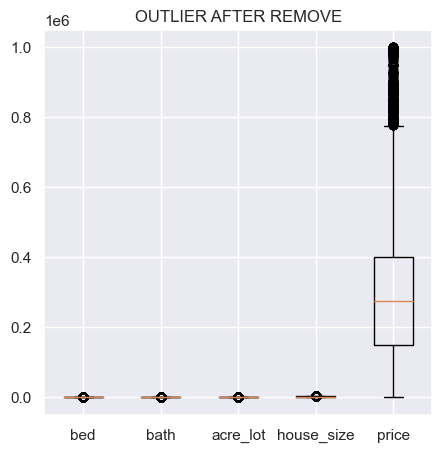

In [60]:
plt.figure(figsize=(5,5))
plt.boxplot(df[column_num])
plt.xticks([1,2,3,4,5],column_num)
plt.title('OUTLIER AFTER REMOVE')
plt.show()

In [61]:
df.describe()

,bed,bath,acre_lot,zip_code,house_size,price
count,10142.000000,10142.000000,10142.000000,10142.000000,10142.000000,10142.000000
mean,3.109051,2.112897,0.604981,3367.459180,1597.266811,307003.863045
std,0.718787,0.734417,0.726960,3060.098418,651.908996,204634.304753
min,2.000000,1.000000,0.000000,601.000000,181.000000,445.000000
25%,3.000000,2.000000,0.110000,1033.000000,1200.000000,149900.000000
50%,3.000000,2.000000,0.280000,2828.500000,1346.000000,274900.000000
75%,3.000000,2.000000,0.800000,6059.500000,1922.000000,400000.000000
max,5.000000,4.000000,3.500000,99999.000000,4026.000000,1000000.000000


# EXPLORATORY DATA ANALYSIS

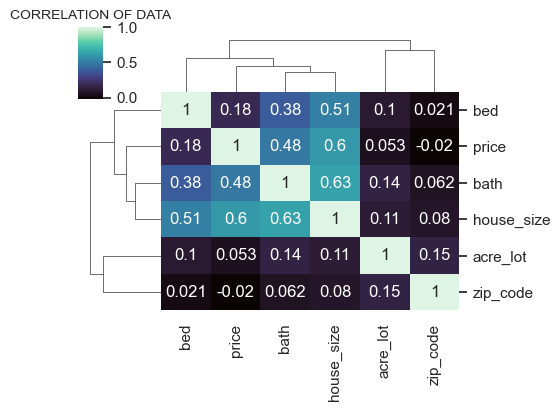

In [64]:
df_numeric = df.select_dtypes(include=[np.number])  # Select only numeric columns
correlation_matrix = df_numeric.corr()

sns.clustermap(
    correlation_matrix,
    annot=True,
    cmap='mako',
    figsize=(5, 4)
)
plt.title('CORRELATION OF DATA', fontsize=10)
plt.show()

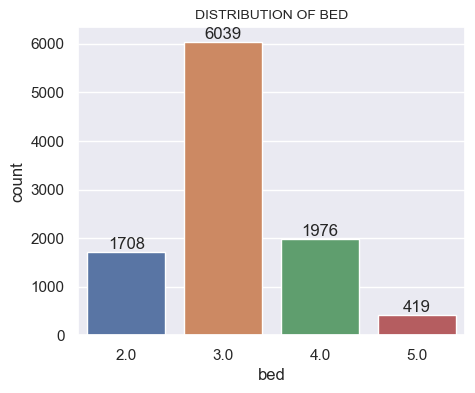

In [65]:
plt.figure(figsize = (5,4))
ax = sns.countplot(data=df,x='bed')
for i in ax.containers:
    ax.bar_label(i,)
plt.title('DISTRIBUTION OF BED',fontsize=10)
plt.show()

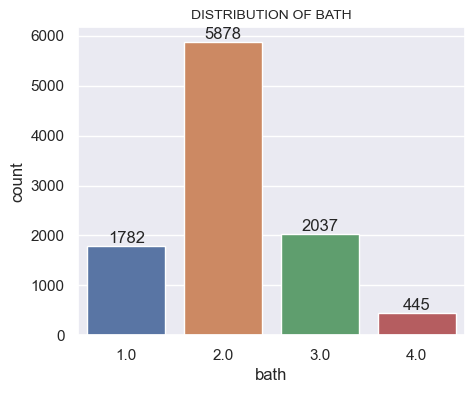

In [66]:
plt.figure(figsize = (5,4))
ax = sns.countplot(data=df,x='bath')
for i in ax.containers:
    ax.bar_label(i,)
plt.title('DISTRIBUTION OF BATH',fontsize=10)
plt.show()

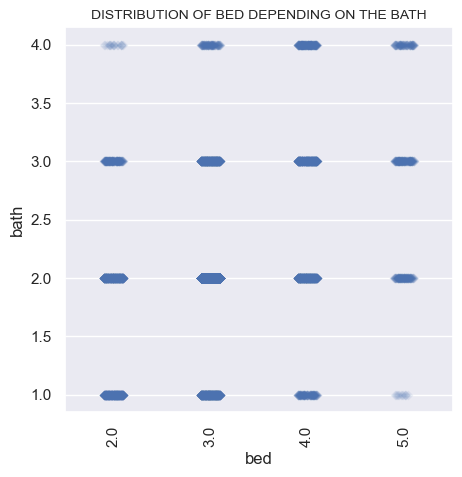

In [67]:
plt.subplots(figsize=(5,5))
plt.xticks(rotation=90)
sns.stripplot(y='bath',x='bed',data=df,marker='D',alpha=0.1)
plt.title('DISTRIBUTION OF BED DEPENDING ON THE BATH',fontsize=10)
plt.show()

In [68]:
df.groupby('bed',as_index=False).agg({'bath' : 'mean'}).sort_values('bath',ascending=False)

,bed,bath
3,5.0,2.806683
2,4.0,2.537449
1,3.0,2.030469
0,2.0,1.742974


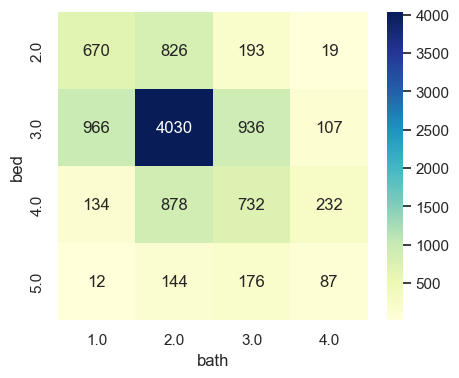

In [69]:
grouped = df.groupby(['bed','bath']).size().reset_index(name='count')

pivot = grouped.pivot(index='bed',columns='bath',values='count')

plt.figure(figsize=(5,4))
sns.heatmap(pivot,cmap='YlGnBu',annot=True,fmt='g')
plt.show()

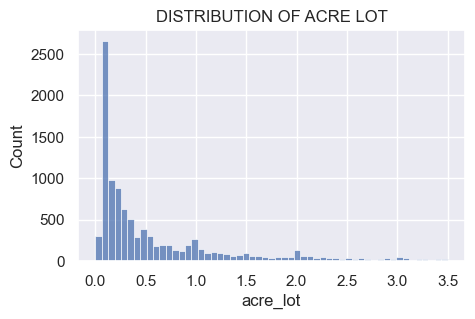

In [70]:
plt.figure(figsize=(5,3))
sns.histplot(data=df,x='acre_lot')
plt.title('DISTRIBUTION OF ACRE LOT')
plt.show()

In [71]:
df['acre_lot'].value_counts()

acre_lot
0.11    1786
0.23     222
0.09     209
0.08     180
0.07     173
        ... 
3.14       1
2.37       1
3.42       1
3.18       1
3.28       1
Name: count, Length: 345, dtype: int64

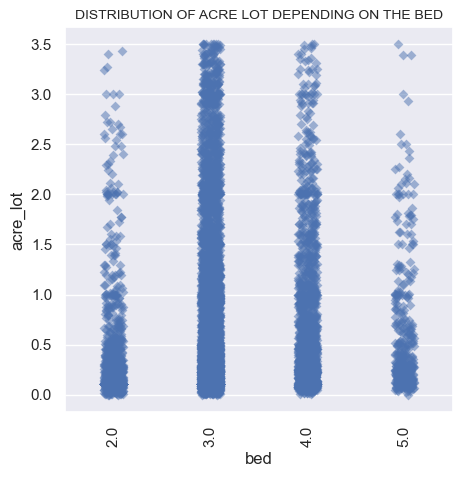

In [72]:
plt.subplots(figsize=(5,5))
plt.xticks(rotation=90)
sns.stripplot(y='acre_lot',x='bed',data=df,marker='D',alpha=0.5)
plt.title('DISTRIBUTION OF ACRE LOT DEPENDING ON THE BED',fontsize=10)
plt.show()

In [73]:
df.groupby('bed',as_index=False).agg({'acre_lot' : 'count'}).sort_values('bed',ascending=False)

,bed,acre_lot
3,5.0,419
2,4.0,1976
1,3.0,6039
0,2.0,1708


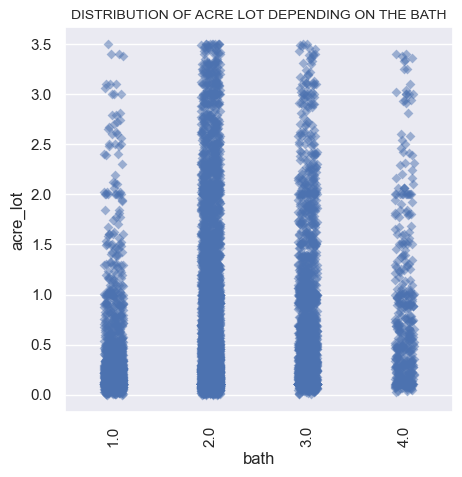

In [74]:
plt.subplots(figsize=(5,5))
plt.xticks(rotation=90)
sns.stripplot(y='acre_lot',x='bath',data=df,marker='D',alpha=0.5)
plt.title('DISTRIBUTION OF ACRE LOT DEPENDING ON THE BATH',fontsize=10)
plt.show()

In [75]:
df.groupby('bath',as_index=False).agg({'acre_lot' : 'count'}).sort_values('bath',ascending=False)

,bath,acre_lot
3,4.0,445
2,3.0,2037
1,2.0,5878
0,1.0,1782


In [90]:
City = df['city'].value_counts().reset_index()
top_5 = City[:5]
fig = px.bar(top_5,'city',y='count',color='city',template='plotly',width=500,height=400)
fig.update_layout(title='DISTRIBUTION OF TOP 5 CITIES WITH MOST HOUSES')
fig.update_traces(texttemplate='%{y:.}',textposition='outside')
fig.show()

In [91]:
top10 = df.groupby('city')['bed'].sum().nlargest(10).reset_index()
fig = px.bar(top10,x='city',y='bed',color='bed',template='plotly',width=500,height=400)
fig.update_layout(title='DISTRIBUTION OF TOP 10 CITIES WITH MOST BEDS')
fig.update_traces(texttemplate='%{y:.}',textposition='outside')
fig.show()

In [92]:
top10 = df.groupby('city')['bath'].sum().nlargest(10).reset_index()
fig = px.bar(top10,x='city',y='bath',color='bath',template='plotly',width=500,height=400)
fig.update_layout(title='DISTRIBUTION OF TOP 10 CITIES WITH MOST BEDS')
fig.update_traces(texttemplate='%{y:.}',textposition='outside')
fig.show()

In [93]:
df_mean = df.groupby('city')[['bed','bath']].mean().reset_index()

df_mean_sort = df_mean.sort_values(by=['bed','bath'],ascending=False)

top10 = df_mean_sort.head(10)

fig = px.bar(
    top10,
    x='city',
    y=['bed','bath'],
    barmode='group',
    color_discrete_sequence=['blue','orange'],
    labels={'value':'Mean Bed and Bath'},
    title='TOP 10 CITIES WITH HIGHEST MEAN BED AND BATH',
    width=500,
    height=500
)
fig.show()

In [94]:
top10 = df.groupby('city')['acre_lot'].sum().nlargest(10).reset_index()
fig = px.bar(top10,x='city',y='acre_lot',color='city',template='plotly',width=500,height=400)
fig.update_layout(title='DISTRIBUTION OF TOP 10 CITIES HIGHEST MOST ACRE LOT')
fig.update_traces(texttemplate='%{y:.}',textposition='outside')
fig.show()

In [95]:
df_mean = df.groupby('city')['acre_lot'].mean().reset_index()

df_mean_sort = df_mean.sort_values(by='acre_lot',ascending=False)

top10 = df_mean_sort.head(10)

fig = px.bar(
    top10,
    x='city',
    y='acre_lot',
    color = 'acre_lot',
    template = 'plotly',
    title='TOP 10 CITIES WITH HIGHEST MEAN ACRE LOT',
    width=500,
    height=500
)
fig.update_layout(xaxis_title='City',yaxis_title='MEAN ACRE LOT')
fig.update_traces(texttemplate='%{y:.2f}',textposition='outside')
fig.show()

In [96]:
fig = px.histogram(df,x='state',nbins=25,color='state',template='plotly',width=500,height=400)
fig.update_layout(title='DISTRIBUTION OF STATE')
fig.update_traces(texttemplate='%{y}',textposition='outside')
fig.show()

In [97]:
city_bed_count = df.groupby(['state','bed']).size().reset_index(name='count')

fig = px.bar(
    city_bed_count,
    x='state',
    y='count',
    color='bed',
    barmode='stack',
    title='DISTRIBUTION OF STATE WITH BED',
    width=500,
    height=500
)
fig.show()

In [98]:
df.groupby('state',as_index=False).agg({'bed':'mean'}).sort_values('bed',ascending=False)

,state,bed
5,Puerto Rico,3.150520
0,Connecticut,3.147343
4,New York,3.103125
9,Vermont,3.099291
6,Rhode Island,3.090072
1,Massachusetts,3.083498
2,New Hampshire,3.012531
10,Virgin Islands,3.007921
3,New Jersey,3.000000
7,South Carolina,3.000000


In [99]:
df.groupby('state',as_index=False).agg({'acre_lot':'mean'}).sort_values('acre_lot',ascending=False)

,state,acre_lot
4,New York,1.159781
9,Vermont,0.970851
8,Tennessee,0.920000
2,New Hampshire,0.870652
10,Virgin Islands,0.792634
1,Massachusetts,0.713926
0,Connecticut,0.696629
6,Rhode Island,0.341966
5,Puerto Rico,0.293251
7,South Carolina,0.110000


In [100]:
fig = px.histogram(df,x='house_size',nbins=20,width=500,height=500)
fig.update_layout(title='DISTRIBUTION ON HOUSE SIZE')
fig.update_traces(texttemplate='%{y}',textposition='outside')
fig.show()

In [101]:
df['house_size'].value_counts()

house_size
1200.0    2010
1500.0      67
1000.0      59
2000.0      55
960.0       54
          ... 
831.0        1
727.0        1
2343.0       1
678.0        1
1727.0       1
Name: count, Length: 2304, dtype: int64

In [102]:
fig = px.histogram(
    df,
    x='house_size',
    color='bed',
    nbins=25,
    marginal='box',
    labels={'house_size':'House Size (sqft)'},
    title='DISTRIBUTION OF HOUSE SIZE WITH BED',
    width=500,
    height=400
)
fig.show()

In [103]:
df.groupby('bed',as_index=False).agg({'house_size':'mean'}).sort_values('house_size',ascending=False)

,bed,house_size
3,5.0,2481.630072
2,4.0,2152.895243
1,3.0,1450.974168
0,2.0,1254.755855


In [104]:
fig = px.histogram(
    df,
    x='house_size',
    color='bath',
    nbins=25,
    marginal='box',
    width=500,
    height=400
)
fig.update_layout(title='DISTRIBUTION OF HOUSE SIZE WITH BATH',xaxis_title='House Size',yaxis_title='Count')
fig.show()

In [105]:
df.groupby('bath',as_index=False).agg({'house_size':'mean'}).sort_values('house_size',ascending=False)

,bath,house_size
3,4.0,2692.761798
2,3.0,2179.508591
1,2.0,1463.076216
0,1.0,1100.774411


In [106]:
fig = px.scatter(
    df,
    x='bed',
    y='bath',
    size='house_size',
    color='bed',
    opacity=1,
    marginal_x='histogram',marginal_y='histogram',
    labels={'bed':'Bedrooms','bath':'Bathrooms','house_size':'House Size'},
    title='DISTRIBUTION OF HOUSE SIZE BY BEDROOMS AND BATHROOMS',
    width=600,
    height=400
)
fig.show()

In [107]:
fig = px.histogram(
    df,
    x='acre_lot',
    y='house_size',
    color='bed',
    nbins=20,
    marginal='box',
    opacity=0.7,
    width=500,
    height=400
)
fig.update_layout(title='DISTRIBUTION OF HOUSE SIZE BY ACRE LOT AND BED',xaxis_title='ACRE LOT',yaxis_title='HOUSE SIZE (SQFT)',legend_title='BED')
fig.show()

In [108]:
df_mean = df.groupby('acre_lot')['house_size'].mean().reset_index()
fig = px.scatter(df_mean,x='acre_lot',y='house_size',title='AVERAGE HOUSE SIZE BY ACRE LOT',trendline='ols',width=500,height=500)
fig.show()

In [109]:
df_mean = df.groupby('city')['house_size'].mean().reset_index()
df_mean_sort = df_mean.sort_values(by='house_size',ascending=False)

top10 = df_mean_sort.head(10)

fig = px.bar(
    top10,
    x='city',
    y='house_size',
    color='house_size',
    color_continuous_scale='RdYlBu_r',
    width=500,
    height=400
)
fig.update_layout(title='TOP 10 CITIES WITH HIGHEST MEAN HOUSE SIZE',
                 xaxis_title='City',
                 yaxis_title='Mean House Size')
fig.update_traces(texttemplate='%{y:.2f}',textposition='outside')
fig.show()

In [110]:
df.groupby('city',as_index=False).agg({'house_size':'mean'}).sort_values('house_size',ascending=False)

,city,house_size
94,Colrain,3645.000000
357,Royalston,3200.000000
119,Dunstable,2958.333333
110,Deerfield,2738.000000
345,Putney,2712.000000
...,...,...
30,Barranquitas,947.000000
406,Storrs,915.500000
248,Maricao,915.000000
310,Oakham,864.000000


In [111]:
df_mean = df.groupby('state')['house_size'].mean().reset_index()
df_mean_sort = df_mean.sort_values(by='house_size',ascending=False)

fig = px.bar(
    df_mean_sort,
    x='state',
    y='house_size',
    color='state',
    width=500,
    height=400
)
fig.update_layout(title='TOP 10 CITIES WITH HIGHEST AVERAGE HOUSE SIZE',
                 xaxis_title='state',
                 yaxis_title='Average House Size (sqft)')
fig.update_traces(texttemplate='%{y:.1f}',textposition='outside')
fig.show()

In [112]:
df.groupby('state',as_index=False).agg({'house_size':'mean'}).sort_values('house_size',ascending=False)

,state,house_size
2,New Hampshire,1748.117794
1,Massachusetts,1677.569450
0,Connecticut,1671.719117
4,New York,1633.225000
6,Rhode Island,1607.785667
9,Vermont,1569.815603
3,New Jersey,1500.000000
5,Puerto Rico,1419.645868
10,Virgin Islands,1247.346535
7,South Carolina,1200.000000


In [113]:
fig = px.histogram(df,x='price',nbins=25,template='plotly',width=500,height=400)
fig.update_layout(title='DISTRIBUTION OF PRICE')
fig.update_traces(texttemplate='%{y}',textposition='outside')
fig.show()

In [114]:
df['price'].value_counts()

price
299900.0    140
249900.0    115
349900.0    115
399900.0    106
225000.0    105
           ... 
653900.0      1
793756.0      1
264800.0      1
474000.0      1
369999.0      1
Name: count, Length: 1419, dtype: int64

In [115]:
fig = px.histogram(df,x='price',color='bed',nbins=20,width=500,height=400)
fig.update_layout(title='DISTRIBUTION OF PRICE BY BED',xaxis_title='Price',yaxis_title='Count')
fig.show()

In [116]:
df.groupby('bed',as_index=False).agg({'price':'mean'}).sort_values('price',ascending=False)

,bed,price
2,4.0,407631.412955
3,5.0,390029.861575
0,2.0,305068.689110
1,3.0,268864.658718


In [117]:
fig = px.histogram(df,x='price',color='bath',nbins=20,width=500,height=400)
fig.update_layout(title='DISTRIBUTION OF PRICE BY BATH',xaxis_title='Price',yaxis_title='Count')
fig.show()

In [118]:
df.groupby('bath',as_index=False).agg({'price':'mean'}).sort_values('price',ascending=False)

,bath,price
3,4.0,562711.894382
2,3.0,473526.656848
1,2.0,258453.497278
0,1.0,212942.159933


In [119]:
df_mean = df.groupby('acre_lot')['price'].mean().reset_index()

fig = px.scatter(df_mean,x='acre_lot',y='price',trendline='ols',width=500,height=400)
fig.update_layout(title='AVERAGE PRICE PER ACRE LOT',xaxis_title='Acre Lot',yaxis_title='Price')
fig.show()

In [120]:
df_mean = df.groupby('city')['price'].mean().reset_index()
df_mean_sort = df_mean.sort_values(by='price',ascending=False)

top10 = df_mean_sort.head(10)

fig = px.bar(
    top10,
    x='city',
    y='price',
    color='city',
    labels={'city':'City','price':'Mean Price'},
    title='TOP 10 CITIES WITH HIGHEST AVERAGE PRICE',
    width=500,
    height=400
)

fig.update_traces(texttemplate='%{y:.1f}',textposition='outside')
fig.show()

In [121]:
df.groupby('city',as_index=False).agg({'price':'mean'}).sort_values('price',ascending=False)

,city,price
451,Wellesley,926666.666667
230,Lexington,896633.333333
49,Boxborough,876568.850000
97,Concord,847966.666667
16,Arlington,834450.000000
...,...,...
208,Jefferson City,34900.000000
324,Peru,29900.000000
356,Rowe,28000.000000
255,McCormick,18950.000000


In [122]:
df_mean = df.groupby('state')['price'].mean().reset_index()
df_mean_sort = df_mean.sort_values(by='price',ascending=False)

fig = px.bar(
    df_mean_sort,
    x='state',
    y='price',
    labels={'state':'State','price':'Mean Price'},
    title='TOP 10 STATES WITH HIGHEST MEAN PRICE',
    width=500,
    height=400
)

fig.update_traces(texttemplate='%{y:.1f}',textposition='outside')
fig.show()

In [123]:
df.groupby('state',as_index=False).agg({'price':'mean'}).sort_values('price',ascending=False)

,state,price
2,New Hampshire,379524.333333
6,Rhode Island,375828.058514
1,Massachusetts,372121.633953
3,New Jersey,333490.000000
0,Connecticut,291685.279158
4,New York,236760.493750
10,Virgin Islands,229989.077228
9,Vermont,216599.985816
5,Puerto Rico,209087.249589
11,Virginia,75000.000000


In [124]:
df_mean = df.groupby('price')['house_size'].mean().reset_index()

fig = px.scatter(
    df_mean,
    x='price',
    y='house_size',
    trendline='ols',
    labels={'price':'Mean Price','house_size':'Mean House Size'},
    title='DISTRIBUTION OF HOUSE SIZE BY PRICE',
    width=500,
    height=500
)

fig.show()

In [125]:
fig = px.scatter(
    df,
    x='house_size',
    y='price',
    color='bed',
    size='bath',
    trendline='ols',
    title='HOUSE SIZE VS PRICE',
    width=500,
    height=500
)

fig.update_layout(xaxis_title='House Size',yaxis_title='Price')
fig.show()

In [126]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import RidgeCV,ElasticNetCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from sklearn.preprocessing import OneHotEncoder,StandardScaler,MinMaxScaler
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error

In [127]:
df['house_size'] = StandardScaler().fit_transform(df['house_size'].values.reshape(len(df),1))
df['price'] = StandardScaler().fit_transform(df['price'].values.reshape(len(df),1))

In [128]:
df['bed'] = StandardScaler().fit_transform(df['bed'].values.reshape(len(df),1))
df['bath'] = StandardScaler().fit_transform(df['bath'].values.reshape(len(df),1))
df['acre_lot'] = StandardScaler().fit_transform(df['acre_lot'].values.reshape(len(df),1))

In [129]:
x = df[['bed','bath','acre_lot','zip_code','house_size','city','state']]
y = df['price']
x = pd.get_dummies(x,columns=['city','state'])
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [130]:
model_DT = DecisionTreeRegressor(max_depth=5)
model_DT.fit(x_train,y_train)
y_pred = model_DT.predict(x_test)
mse_DT = mean_squared_error(y_test,y_pred)
rmse_DT = mean_squared_error(y_test,y_pred,squared=False)
mae_DT = mean_absolute_error(y_test,y_pred)
r2_DT = r2_score(y_test,y_pred)

In [131]:
model_RF = RandomForestRegressor(n_estimators=100,random_state=42)
model_RF.fit(x_train,y_train)
y_pred = model_RF.predict(x_test)
mse_RF = mean_squared_error(y_test,y_pred)
rmse_RF = mean_squared_error(y_test,y_pred,squared=False)
mae_RF = mean_absolute_error(y_test,y_pred)
r2_RF = r2_score(y_test,y_pred)

In [132]:
model_GD = GradientBoostingRegressor(
    learning_rate=0.05,
    n_estimators=150,
    max_depth=3,
    min_samples_split=4,
    min_samples_leaf=1
)
model_GD.fit(x_train,y_train)
y_pred = model_GD.predict(x_test)
mse_GD = mean_squared_error(y_test,y_pred)
rmse_GD = mean_squared_error(y_test,y_pred,squared=False)
mae_GD = mean_absolute_error(y_test,y_pred)
r2_GD = r2_score(y_test,y_pred)

In [133]:
results = {
    'DECISION TREE': {'MSE':mse_DT,'RMSE':rmse_DT,'MAE':mae_DT,'R^2':r2_DT},
    'RANDOM FOREST': {'MSE':mse_RF,'RMSE':rmse_RF,'MAE':mae_RF,'R^2':r2_RF},
    'GRADIENT BOOSTING': {'MSE':mse_GD,'RMSE':rmse_GD,'MAE':mae_GD,'R^2':r2_GD}
}

data = pd.DataFrame.from_dict(results,orient='index')
data = data.applymap(lambda x:f'{x:.2f}')

In [134]:
data

,MSE,RMSE,MAE,R^2
DECISION TREE,0.44,0.66,0.49,0.55
RANDOM FOREST,0.27,0.52,0.34,0.72
GRADIENT BOOSTING,0.35,0.59,0.42,0.64


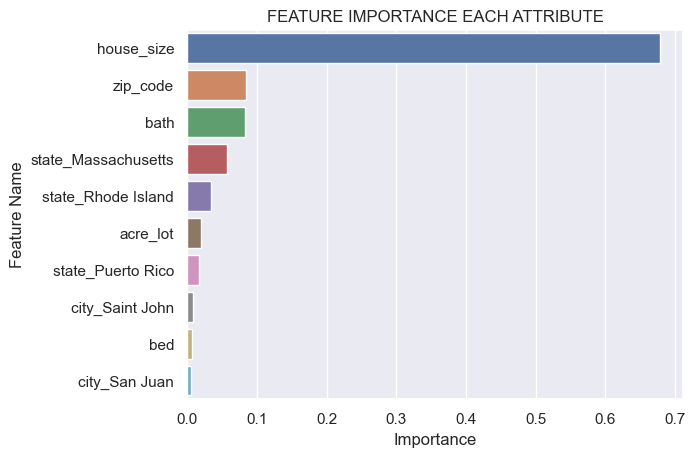

In [135]:
imp_df = pd.DataFrame({
    'Feature Name':x_train.columns,
    'Importance':model_DT.feature_importances_
})

fi = imp_df.sort_values(by='Importance',ascending=False)
fi2 = fi.head(10)
sns.barplot(data=fi2,x='Importance',y='Feature Name')
plt.title('FEATURE IMPORTANCE EACH ATTRIBUTE')
plt.xlabel('Importance')
plt.ylabel('Feature Name')
plt.show()

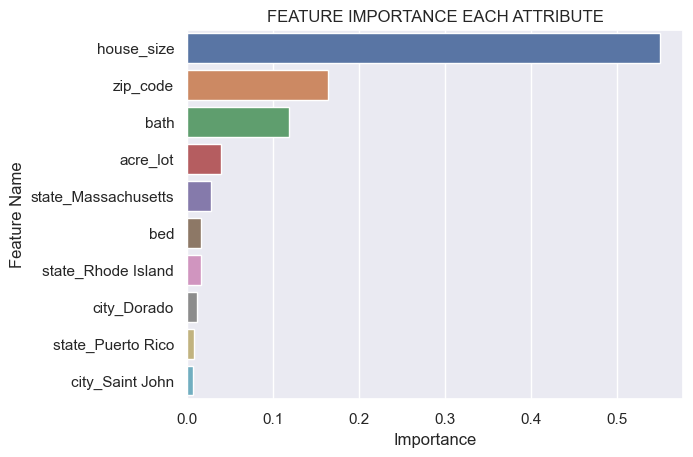

In [136]:
imp_df = pd.DataFrame({
    'Feature Name':x_train.columns,
    'Importance':model_GD.feature_importances_
})

fi = imp_df.sort_values(by='Importance',ascending=False)
fi2 = fi.head(10)
sns.barplot(data=fi2,x='Importance',y='Feature Name')
plt.title('FEATURE IMPORTANCE EACH ATTRIBUTE')
plt.xlabel('Importance')
plt.ylabel('Feature Name')
plt.show()

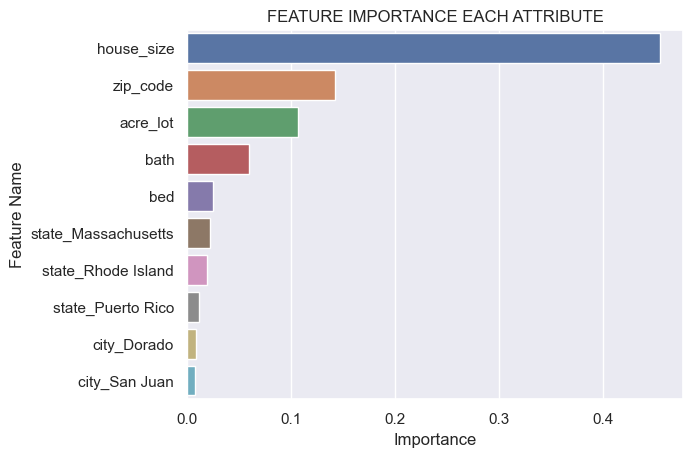

In [137]:
imp_df = pd.DataFrame({
    'Feature Name':x_train.columns,
    'Importance':model_RF.feature_importances_
})

fi = imp_df.sort_values(by='Importance',ascending=False)
fi2 = fi.head(10)
sns.barplot(data=fi2,x='Importance',y='Feature Name')
plt.title('FEATURE IMPORTANCE EACH ATTRIBUTE')
plt.xlabel('Importance')
plt.ylabel('Feature Name')
plt.show()